<div style="padding:10px; margin:0;font-family:newtimeroman;font-size:300%;text-align:center;border-radius: 30px 10px;overflow:hidden;font-weight:700;background-color:#272643; color:white">
    Car Plate Digits Detection

<div style="text-align:center;">
    <img src='https://i.postimg.cc/HsZM0qJK/Untitled.png'>

<a id="Initializations"></a>
# <p style="padding:10px; margin:0;color:#440381 ;font-size:120% ;text-align:center; border-radius:10px 10px; padding:5px; border:solid 2px #09375b; box-shadow: 8px 8px 8px #042b4c; overflow:hidden;font-weight:900; background-color:#0b0259; color:white">Initializations

## <a id='step01'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Install required libraries

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 At the first step, Install requred python librasries with <code>pip install</code> command.

In [1]:
! pip install -q ultralytics
! pip install -q wandb

In [2]:
import wandb
wandb.init(mode="disabled")

## <a id='step02'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Imports

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Now, we should import necessary libraries that installed befor, with <code>import</code> command.

In [3]:
import os                        # To work with operation system commands
import cv2                       # To process images
import random                    # to generate random choices
import warnings                  # To avoid python warnings
import numpy as np               # To work with arrays
import pandas as pd              # To work with DataFrames
import seaborn as sns            # To visualizations
from tqdm import tqdm            # To represent progress bars
from ultralytics import YOLO     # To Create Yolo model
from termcolor import colored    # To colorfull outputs
import matplotlib.pyplot as plt  # To visualizations

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## <a id='step03'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Libraries Configuarations

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Now apply some library costomization.

In [4]:
# ignore python warnings
warnings.filterwarnings('ignore')

# add style to plots
plt.style.use('fivethirtyeight')
sns.set_style('darkgrid')

<a id="Phase1"></a>
# <p style="padding:10px; margin:0;color:#440381 ;font-size:120% ;text-align:center; border-radius:10px 10px; padding:5px; border:solid 2px #09375b; box-shadow: 8px 8px 8px #042b4c; overflow:hidden;font-weight:900; background-color:#0b0259; color:white">Phase 1 - Plate Detection with Ultralytitcs

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Now we want to start the work !</p>
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 The <b>Goal</b> is to read a car image and detect its plate by cordinates.

## <a id='step11'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Data Loading

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Define <b>working Directory</b> path to access the saved files in it.

In [5]:
# Path of working-Directory
working_dir = '/kaggle/working/'

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Now, we need to read first dataset (cars images), and define path of its folders by using <b>os</b> library according to <b>yaml file</b>. 

In [6]:
# Path of car-detection dataset
plate_base = '/kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8'

# Path of yaml file
plate_yaml_path = os.path.join(plate_base, 'data.yaml')

# Path of Train directory
plate_train_dir = os.path.join(plate_base, 'train')
plate_train_images = os.path.join(plate_train_dir, 'images')
plate_train_labels = os.path.join(plate_train_dir, 'labels')

# Path of Validation directory
plate_valid_dir = os.path.join(plate_base, 'valid')
plate_valid_images = os.path.join(plate_valid_dir, 'images')
plate_valid_labels = os.path.join(plate_valid_images, 'labels')

# Path of Test directory
plate_test_dir = os.path.join(plate_base, 'test')
plate_test_images = os.path.join(plate_test_dir, 'images')
plate_test_labels = os.path.join(plate_test_dir, 'labels')

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 For our information, by using <code>os.listdir()</code> function, we can count the number of images in each folder.

In [7]:
print(colored(f' Number of Train Images : {len(os.listdir(plate_train_images))} ', 'blue', attrs=['bold']))
print(colored(f' Number of Validation Images : {len(os.listdir(plate_valid_images))}', 'blue', attrs=['bold']))
print(colored(f' Number of Test Images : {len(os.listdir(plate_test_images))} ', 'blue', attrs=['bold']))
print('_'*40)
print(colored(f' Number of All Images : {len(os.listdir(plate_train_images)) + len(os.listdir(plate_valid_images)) + len(os.listdir(plate_test_images))} ', 'green', attrs=['bold']))

 Number of Train Images : 219 
 Number of Validation Images : 63
 Number of Test Images : 31 
________________________________________
 Number of All Images : 313 


## <a id='step12'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Image Sizes

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 To feed images to Yolo model, all of images should have a uniqu size, So we loop over train images and calculate their size after reading each one of them, stored in a <b>set</b> to avoid repeatation. see the result :

In [8]:
def Image_Size(train_images) :
    '''
    Read images and save image-sizes in a set
    '''
    img_sizes = set()
    
    # Loop over train images and read them
    for img_name in tqdm(os.listdir(train_images)) :
        img_path = os.path.join(train_images, img_name)
        img = cv2.imread(img_path)
        h, w, c = img.shape
        img_sizes.add((h, w))

    return img_sizes

img_sizes = Image_Size(plate_train_images)

if len(img_sizes) == 1 :
    print(colored(f'\n All the images have size of {img_sizes} ', 'green', attrs=['bold']))
else :
    print(colored(f'\n There are {len(img_sizes)} different image sizes ! ', 'red', attrs=['bold']))


100%|██████████| 219/219 [00:02<00:00, 80.85it/s]


 All the images have size of {(640, 640)} 


<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 OK ! Lets set <b>Height</b> and <b>width</b> of images .

In [9]:
# Height and Width of all images
H = list(img_sizes)[0][0]
W = list(img_sizes)[0][1]

print(colored(f'Height : {H}\nWidth : {W}', 'black', 'on_white', attrs=['bold']))

Height : 640
Width : 640


## <a id='step13'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Plot Random Images With BBOXs

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 First, define some functions to avoid extra coding.

In [10]:
def TXT_To_BBOX(lbl_path) :
    '''
    Read txt files and extract points of bonding-boxes.
    '''
    # Read text file and split it by white-space
    bbox = open(lbl_path, 'r')
    bbox = bbox.read()
    bbox = bbox.split(' ')[1:]

    # determine points of bboxes edge
    p1 = [int(float(bbox[0])*H), int(float(bbox[1])*W)]
    p2 = [int(float(bbox[2])*H), int(float(bbox[3])*W)]
    p3 = [int(float(bbox[4])*H), int(float(bbox[5])*W)]
    p4 = [int(float(bbox[6])*H), int(float(bbox[7])*W)]

    # convert points to array and reshape it
    pts = np.array([p1, p2, p3, p4], np.int32)
    pts = pts.reshape((-1, 1, 2))
    return pts

In [11]:
def JPG_Name_To_TXT(img_name) :
    '''
    Based on image name, find text file in label folder. 
    '''
    # Seperate prefix and sufix of image name
    name = img_name.split('.')[:-1]
    name = '.'.join(name)
    txt_name = name + '.txt'
    return txt_name

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Now, Plot random number of <b>train images</b> and draw their bondingbox from label folder with <b>opencv</b> library.

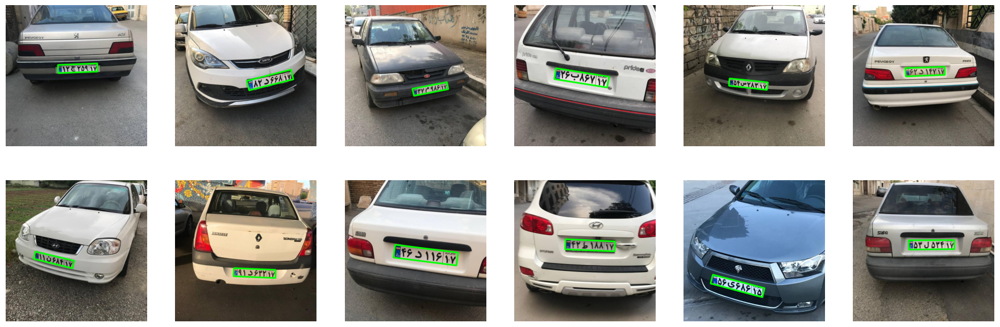

In [12]:
def Plot_Random_Images() :
    '''
    Read and randomly choose some images and plot them with their bboxes in train folder.
    '''
    # Select K random number of train images
    random_images = random.choices(os.listdir(plate_train_images), k=12)
    # manual iterator
    i = 1
    # plot images and bboxes
    plt.figure(figsize=(20, 7))
    for img_name in random_images :
        plt.subplot(2, 6, i)
        # Image
        img_path = os.path.join(plate_train_images, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # BBox
        txt_name = JPG_Name_To_TXT(img_name)
        lbl_path = os.path.join(plate_train_labels, txt_name)
        pts = TXT_To_BBOX(lbl_path)
        cv2.polylines(img, [pts], True, (0, 255, 0), 5, cv2.LINE_AA)

        plt.imshow(img)
        plt.axis('off')
        i += 1
Plot_Random_Images()

## <a id='step14'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Model 1 - Plate Detector

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 YOLOv8 is the latest iteration in the YOLO series of real-time object detectors, offering cutting-edge performance in terms of accuracy and speed. Building upon the advancements of previous YOLO versions, YOLOv8 introduces new features and optimizations that make it an ideal choice for various object detection tasks in a wide range of applications.

<div style="text-align:center;">
    <img src='https://i.postimg.cc/3xkvttmw/yolov8-comparison-plots-avif.jpg'>

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Here, Define a raw YoloV8n model and load pretrained weights on it to increase model accuracy. Then train the model with train-images and validate it with validation-images.

In [13]:
# Create a YoloV8n model and load pretrained weights
yolo_model = YOLO('yolov8n.yaml').load('yolov8n.pt')

# Train the model with train images and labels
result = yolo_model.train(data=plate_yaml_path, epochs=20, amp=False)

100%|██████████| 6.25M/6.25M [00:00<00:00, 70.6MB/s]

Transferred 355/355 items from pretrained weights


Ultralytics 8.3.21 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=yolov8n.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cro

100%|██████████| 755k/755k [00:00<00:00, 13.4MB/s]
2024-10-24 07:41:35,521	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-24 07:41:36,193	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/train/labels... 219 images, 0 backgrounds, 0 corrupt: 100%|██████████| 219/219 [00:00<00:00, 322.89it/s]

train: WARNING ⚠️ Cache directory /kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/valid/labels... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<00:00, 174.58it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      3.71G      1.153      3.097      1.211         21        640: 100%|██████████| 14/14 [00:05<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.35s/it]

                   all         63         63          1      0.522       0.99      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      3.66G     0.8543      1.716     0.9144         22        640: 100%|██████████| 14/14 [00:03<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.89it/s]

                   all         63         63          1      0.274      0.758      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      3.66G     0.8106      1.413     0.9037         20        640: 100%|██████████| 14/14 [00:03<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.79it/s]

                   all         63         63      0.943      0.261        0.9      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      3.66G     0.8713      1.331     0.9196         21        640: 100%|██████████| 14/14 [00:03<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.88it/s]

                   all         63         63       0.96      0.378      0.962      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      3.66G     0.7923      1.303     0.9283         18        640: 100%|██████████| 14/14 [00:03<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.63it/s]

                   all         63         63       0.94      0.498      0.898      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      3.66G     0.8375      1.165     0.9209         21        640: 100%|██████████| 14/14 [00:03<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.55it/s]

                   all         63         63      0.966          1      0.994      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      3.66G     0.8325      1.177     0.9379         23        640: 100%|██████████| 14/14 [00:03<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.86it/s]

                   all         63         63      0.976          1      0.991      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      3.66G     0.7839      1.102      0.931         17        640: 100%|██████████| 14/14 [00:03<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.76it/s]

                   all         63         63      0.954      0.988      0.994      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      3.66G     0.7674       1.04     0.9319         16        640: 100%|██████████| 14/14 [00:03<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.92it/s]

                   all         63         63      0.984      0.994      0.994      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      3.66G     0.7323     0.9365     0.9082         21        640: 100%|██████████| 14/14 [00:03<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.00it/s]

                   all         63         63      0.967          1      0.994      0.821


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      3.66G     0.6807      1.125      0.897         11        640: 100%|██████████| 14/14 [00:04<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.75it/s]

                   all         63         63      0.982          1      0.995      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      3.66G     0.6463      1.023      0.869         11        640: 100%|██████████| 14/14 [00:03<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.95it/s]

                   all         63         63      0.998          1      0.995      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      3.66G     0.6393     0.9565      0.858         11        640: 100%|██████████| 14/14 [00:03<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.05it/s]

                   all         63         63      0.998          1      0.995      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      3.66G     0.6182     0.8857     0.8661         11        640: 100%|██████████| 14/14 [00:03<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.63it/s]

                   all         63         63      0.997          1      0.995      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      3.66G     0.6159      0.881     0.8619         11        640: 100%|██████████| 14/14 [00:03<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]

                   all         63         63      0.998          1      0.995      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      3.66G     0.5686     0.8199     0.8539         11        640: 100%|██████████| 14/14 [00:03<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.04it/s]

                   all         63         63      0.997          1      0.995      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.66G      0.509     0.7707     0.8313         11        640: 100%|██████████| 14/14 [00:03<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.01it/s]

                   all         63         63      0.998          1      0.995      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      3.66G     0.4669     0.7237     0.8258         11        640: 100%|██████████| 14/14 [00:03<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.93it/s]

                   all         63         63      0.996          1      0.995      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      3.66G     0.4588     0.7033     0.8063         11        640: 100%|██████████| 14/14 [00:03<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.65it/s]

                   all         63         63      0.997          1      0.995      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      3.66G     0.4226     0.6738     0.7976         11        640: 100%|██████████| 14/14 [00:03<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.86it/s]

                   all         63         63      0.997          1      0.995      0.914



20 epochs completed in 0.029 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.21 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.51it/s]


                   all         63         63      0.997          1      0.995      0.914
Speed: 0.2ms preprocess, 5.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train


## <a id='step15'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Train Result

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 After trainig, result will save in working directory. plot the results.

In [14]:
# Location of stored result
result_path = result.save_dir

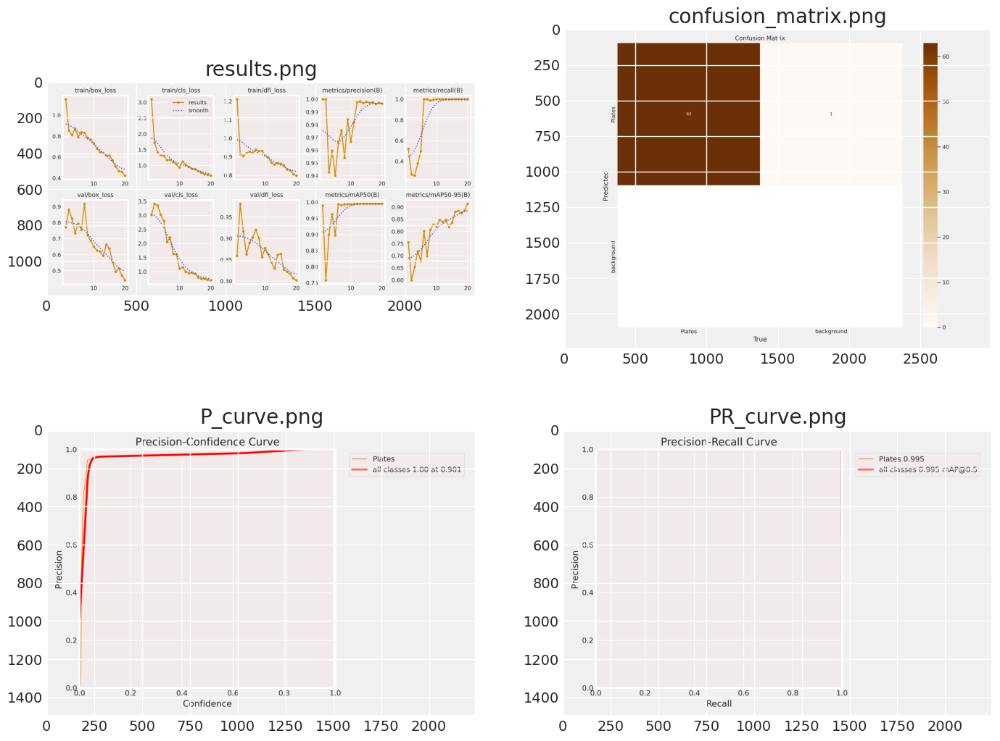

In [15]:
# List of some metrics
metrics = ['results.png','confusion_matrix.png', 'P_curve.png', 'PR_curve.png']

plt.figure(figsize=(15, 12))
i = 1

for image_name in metrics:
    # Path of metrics images
    image_path = os.path.join(result_path, image_name)
    image = cv2.imread(image_path)

    # Plot images    
    plt.subplot(2, 2, i)    
    plt.imshow(image)
    plt.title(image_name)
    i += 1

plt.show()

In [16]:
# Read csv of result
df = pd.read_csv(os.path.join(result_path, 'results.csv'))
df.tail(5)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
15,16,85.8784,0.56864,0.81994,0.85391,0.99718,1.0,0.995,0.88057,0.55327,0.79588,0.82690,0.000515,0.000515,0.000515
16,17,90.6091,0.50900,0.77072,0.83127,0.99765,1.0,0.995,0.88436,0.49385,0.74451,0.82186,0.000416,0.000416,0.000416
17,18,95.3440,0.46688,0.72371,0.82581,0.99641,1.0,0.995,0.87554,0.51374,0.74822,0.81715,0.000317,0.000317,0.000317
18,19,100.1410,0.45878,0.70331,0.80625,0.99698,1.0,0.995,0.88679,0.46952,0.71178,0.80692,0.000218,0.000218,0.000218
19,20,104.9080,0.42259,0.67377,0.79764,0.99667,1.0,0.995,0.91361,0.43998,0.69453,0.80184,0.000119,0.000119,0.000119


In [17]:
# Strip columns
df.columns = df.columns.str.strip()
df.columns

Index(['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')

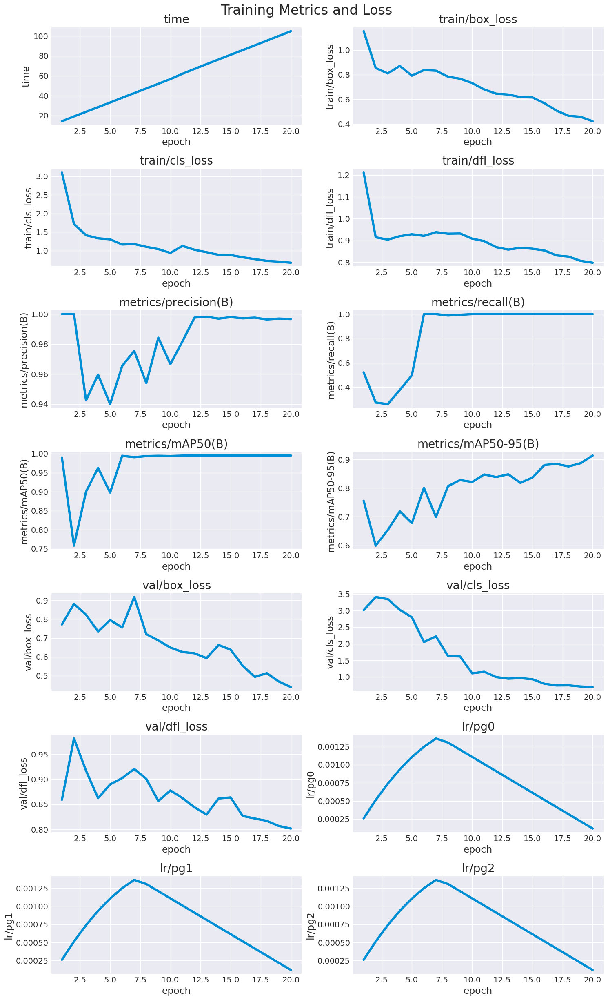

In [18]:
# Define X, y to plot
X = df.epoch
cols = df.columns[1:]

plt.figure(figsize=(15, 25))

for it in range(len(cols)) :
    plt.subplot(7, 2, it+1)
    ax = sns.lineplot(data=df, x=X, y=cols[it])
    ax.set_title(cols[it])
plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.6)
plt.tight_layout()
plt.show()

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Best weights for training, stored in <b>weights</b> folder as <b>best.pt</b>. load best weight in a model.

In [19]:
# Load model with best weights
best_model_path = os.path.join(result_path, 'weights/best.pt')
best_model_plate = YOLO(best_model_path)

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Here, Evaluating the model by validation images and labels to measure the model accuracy.

In [20]:
# Evaluating the model
result_test = best_model_plate.val()

Ultralytics 8.3.21 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/valid/labels... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<00:00, 670.47it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.05it/s]


                   all         63         63      0.997          1      0.995      0.914
Speed: 0.3ms preprocess, 6.0ms inference, 0.0ms loss, 4.3ms postprocess per image
Results saved to runs/detect/val


<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Call some of metrics to show model accuracy stored in working directory.

In [21]:
# list of metrics
keys = ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)']

for key in keys :
    print(colored(f'{key} : {result_test.results_dict[key]}', 'green', attrs=['bold']))

metrics/precision(B) : 0.9967148720080121
metrics/recall(B) : 1.0
metrics/mAP50(B) : 0.995


<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Good job ! The model is trained successfully.

## <a id='step16'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Test the first model

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Now, we should test the model with non-seen data(Test Directory) to find out the model responsibility, We choose random number of Test-images.

In [22]:
# all test images
images = os.listdir(plate_test_images)

# K - number of random images
num_samples = 12
random_images = random.choices(images, k=num_samples)

# Create a list of random images paths
images = []
for image in random_images :
    image_path = os.path.join(plate_test_images, image)
    images.append(image_path)

images

['/kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/test/images/462_png.rf.56afd7c388f912b3f984913fc564620b.jpg',
 '/kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/test/images/301_png.rf.17abf3f5b0b7a9823129bbc60b686d37.jpg',
 '/kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/test/images/331_png.rf.d16d57d202611ac872fd12491458f9ed.jpg',
 '/kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/test/images/397_png.rf.0cfd232f20f6d5871ff92dfd2fab7440.jpg',
 '/kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/test/images/360_png.rf.9d52e0a54009152cfbb221edc5343fc3.jpg',
 '/kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/test/images/288_png.rf.2e7e5047ff4c47868c9d7ee7398220eb.jpg',
 '/kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/test/images/415_png.rf.2b4f94b0cfa198e30d70f80c70fa3a32.jpg',
 '/kaggle/input/car-plate-detection-yolov8/Persian_Car_Plates_YOLOV8/test/images/20

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Predict plates boundingboxes of random images. 

In [23]:
# Predict bbox of images one by one
for image in images :
    result = best_model_plate.predict([image], save=True, conf=0.5, iou=0.7) 


0: 640x640 1 Plates, 10.8ms
Speed: 4.0ms preprocess, 10.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

0: 640x640 1 Plates, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

0: 640x640 1 Plates, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

0: 640x640 1 Plates, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

0: 640x640 1 Plates, 7.3ms
Speed: 1.4ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

0: 640x640 1 Plates, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

0: 640x640 1 Plates, 7.3ms
Spee

In [24]:
# Location of saved predicted images
result_path = result[0].save_dir
print(result_path)

runs/detect/predict


<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 And plot the car images with predicted bboxes. Its a visual test.

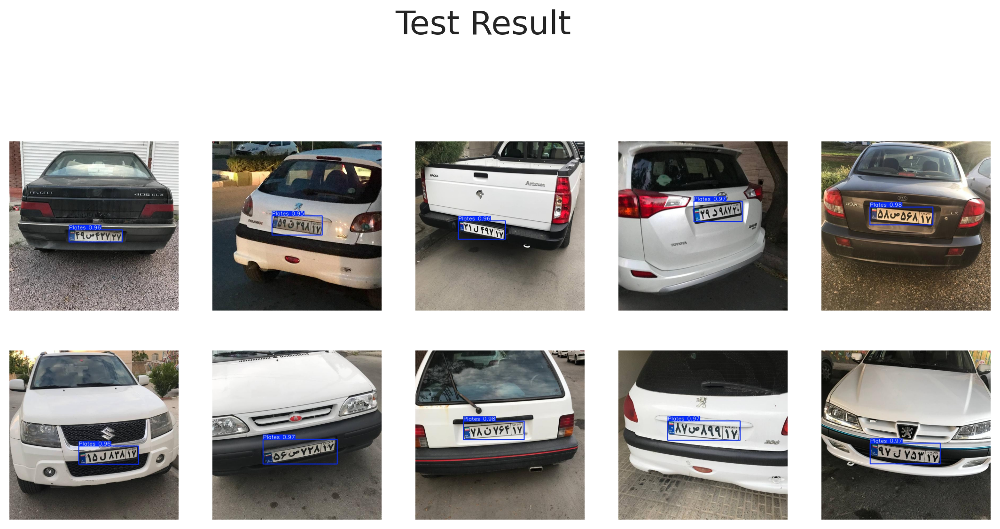

In [25]:
# Show images
i = 1
plt.figure(figsize=(12, 6), dpi=200)
for image in os.listdir(result_path) :
    image_path = os.path.join(result_path, image)
    plt.suptitle('Test Result', fontsize=25, fontweight=500)
    plt.subplot(2, 5, i)
    plt.imshow(plt.imread(image_path))
    plt.axis('off')
    plt.subplots_adjust(top=0.75)
    i+=1
    if i==11 : break
plt.show()

<div style="background-color:lightgreen; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;"> 👍<b>It seems Perfect, all the plates recognized succesfully. Lets go to the another phase.

<a id="Phase2"></a>
# <p style="padding:10px; margin:0;color:#440381 ;font-size:120% ;text-align:center; border-radius:10px 10px; padding:5px; border:solid 2px #09375b; box-shadow: 8px 8px 8px #042b4c; overflow:hidden;font-weight:900; background-color:#0b0259; color:white">Phase 2 - Detect Plates Char and Digits</p>

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 In this phase, we use another dataset to detect digits in each plate. The <b>Goal</b> is to detect and recognize numbers and char successfully.

## <a id='step21'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Data Loading

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Load and read new dataset and define neccessary paths like befor according to <b>yaml</b> file.

In [26]:
# Path of car-detection dataset
digits_base = '/kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2'

# Path of yaml file
digits_yaml_path = os.path.join(digits_base, 'data.yaml')

# Path of Train directory
digits_train_dir = os.path.join(digits_base, 'train')
digits_train_images = os.path.join(digits_train_dir, 'images')
digits_train_labels = os.path.join(digits_train_dir, 'labels')

# Path of Validation directory
digits_valid_dir = os.path.join(digits_base, 'valid')
digits_valid_images = os.path.join(digits_valid_dir, 'images')
digits_valid_labels = os.path.join(digits_valid_images, 'labels')

# Path of Test directory
digits_test_dir = os.path.join(digits_base, 'test')
digits_test_images = os.path.join(digits_test_dir, 'images')
digits_test_labels = os.path.join(digits_test_dir, 'labels')

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Count images in each folder by using <b>os.lidtdir()</b> function.

In [27]:
print(colored(f' Number of Train Images : {len(os.listdir(digits_train_images))} ', 'blue', attrs=['bold']))
print(colored(f' Number of Validation Images : {len(os.listdir(digits_valid_images))}', 'blue', attrs=['bold']))
print(colored(f' Number of Test Images : {len(os.listdir(digits_test_images))} ', 'blue', attrs=['bold']))
print('_'*40)
print(colored(f' Number of All Images : {len(os.listdir(digits_train_images)) + len(os.listdir(digits_valid_images)) + len(os.listdir(digits_test_images))} ', 'green',  attrs=['bold']))

 Number of Train Images : 1203 
 Number of Validation Images : 115
 Number of Test Images : 57 
________________________________________
 Number of All Images : 1375 


## <a id='step22'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Image sizes

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 To feed images to Yolo model, all of images should have a uniqu size, So we loop over train images and calculate their size after reading each one of them, stored in a <b>set</b> to avoid repeatation. see the result :

In [28]:
# Call the function in phase 1
img_sizes_digits = Image_Size(digits_train_images)

if len(img_sizes_digits) == 1 :
    print(colored(f'\n All the images have size of {img_sizes_digits} ', 'green', attrs=['bold']))
else :
    print(colored(f'\n There are {len(img_sizes_digits)} different image sizes ! ', 'red', attrs=['bold']))


100%|██████████| 1203/1203 [00:10<00:00, 112.40it/s]


 All the images have size of {(70, 200)} 


<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Define unique <b>Height</b> and <b>Width</b> for all images.

In [29]:
# Height and Width for all images
H_d = list(img_sizes_digits)[0][0]
W_d = list(img_sizes_digits)[0][1]

print(colored(f'Height : {H_d}\nWidth : {W_d}', 'black', attrs=['bold']))

Height : 70
Width : 200


## <a id='step23'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Label Dict

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 In this part, define a dictionary that keys are predicted classes that are indexes and values are real values in plates. We use this dictionary as a Decoder.

In [30]:
classes_dict =  {
            '0':'0',
            '1':'1',
            '2':'2',
            '3':'3',
            '4':'4',
            '5':'5',
            '6':'6',
            '7':'7', 
            '8':'8',
            '9':'9',
            '10':'B',
            '11':'C',
            '12':'D',
            '13':'G', 
            '14':'H',
            '15':'J',
            '16':'L',
            '17':'M', 
            '18':'N', 
            '19':'S', 
            '20':'T', 
            '21':'V', 
            '22':'Y'
            }

## <a id='step24'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Plot Random Images With BBOXs

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 With function below, boundingboxes are read from yaml files and codinates of each box calculated, then draw them in images.</p>
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 <b>NOTE : </b> All values are <b>Normalized</b>.

In [31]:
def draw_box(img, bboxes) :
    '''
    Read bboxes cordinates and calculate correct cordinates to draw rectangles. 
    '''
    # bboxes contain 8 bbox for each image
    for i in range(len(bboxes)) :  
        b1 = bboxes[i]
        b1 = b1.split(' ')

        # Decode the label index by classes_dict
        label = classes_dict[b1[0]]

        # Unnormalize centers
        x_center = float(b1[1]) * W_d
        y_center = float(b1[2]) * H_d
        w = float(b1[3]) * W_d
        h = float(b1[4]) * H_d

        # Determine 2 point of each box (top-left, bottom-right)
        x_min = round(x_center - (w / 2))
        x_max = round(x_center + (w / 2))
        y_min = round(y_center - (h / 2))
        y_max = round(y_center + (h / 2))

        # A small box above earlier boxes to write value in it
        x1 = round(x_center - w/4)
        x2 = round(x_center + w/4)
        y1 = round(3)
        y2 = round(10)

        # Draw boxes and write the values in them
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 0, 255), 1, cv2.LINE_AA)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 0), -1, cv2.LINE_AA)
        cv2.putText(img, label, (x1, y1+9), cv2.FONT_HERSHEY_COMPLEX, 0.35, (0, 255, 255), 1, cv2.LINE_AA)

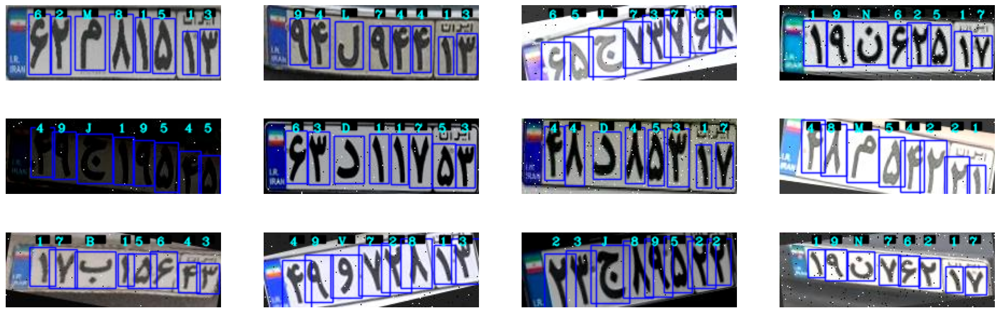

In [32]:
# Select K random images
random_images = random.choices(os.listdir(digits_train_images), k=12)
i = 1
plt.figure(figsize=(20, 7))
for img_name in random_images :
    plt.subplot(3, 4, i)
    # Image
    img_path = os.path.join(digits_train_images, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # # BBox
    txt_name = JPG_Name_To_TXT(img_name)
    lbl_path = os.path.join(digits_train_labels, txt_name)
    bboxes = open(lbl_path)
    bboxes = bboxes.readlines()

    draw_box(img, bboxes)

    plt.imshow(img)
    plt.axis('off')
    i += 1
plt.show()

## <a id='step25'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Model 2 - Digits Detector

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 now, build second yolo model like before, from scartch and load pretrained weights on it. Then train it by train-images of dataset.

In [33]:
wandb.init(mode="disabled")

In [34]:
# Create another yolo model and load the pretrained weights on it
yolo_model = YOLO('yolov8n.yaml').load('yolov8n.pt')

# Trian the model with train images and labels 
result = yolo_model.train(data=digits_yaml_path, epochs=50, amp=False)

Transferred 355/355 items from pretrained weights
Ultralytics 8.3.21 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=yolov8n.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None,

train: Scanning /kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/train/labels... 1203 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1203/1203 [00:05<00:00, 231.27it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/valid/labels... 115 images, 0 backgrounds, 0 corrupt: 100%|██████████| 115/115 [00:00<00:00, 146.57it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00037, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.88G      1.431      3.787      1.247         79        640: 100%|██████████| 76/76 [00:20<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.68it/s]

                   all        115        918      0.719      0.141      0.186      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.82G      1.214      1.989      1.182         47        640: 100%|██████████| 76/76 [00:19<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.92it/s]

                   all        115        918      0.526      0.613      0.609      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      3.79G      1.138      1.304       1.18         70        640: 100%|██████████| 76/76 [00:19<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.95it/s]

                   all        115        918      0.593      0.822      0.783      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.81G      1.091       1.08      1.153         61        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.11it/s]

                   all        115        918      0.894      0.877      0.932      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.76G       1.06     0.9776      1.132         55        640: 100%|██████████| 76/76 [00:19<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.93it/s]

                   all        115        918       0.89      0.909      0.948      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      3.81G       1.03     0.8879      1.122         78        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.90it/s]

                   all        115        918      0.886      0.977      0.964      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.79G       1.02     0.8492      1.108         57        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.89it/s]

                   all        115        918      0.931      0.981      0.974      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.79G     0.9913     0.8216      1.096         66        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.89it/s]

                   all        115        918      0.949      0.973      0.976      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.79G     0.9771     0.7976      1.089         45        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.01it/s]

                   all        115        918      0.967      0.973      0.981      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.79G      0.978     0.7691      1.087         41        640: 100%|██████████| 76/76 [00:19<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.07it/s]

                   all        115        918      0.962      0.978      0.984      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.79G     0.9627     0.7534      1.078         48        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.13it/s]

                   all        115        918      0.959      0.981      0.982      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       3.8G     0.9544     0.7465      1.072         48        640: 100%|██████████| 76/76 [00:19<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.12it/s]

                   all        115        918      0.964      0.984      0.984      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       3.8G     0.9384     0.7169      1.069         50        640: 100%|██████████| 76/76 [00:19<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.02it/s]

                   all        115        918      0.969      0.976      0.985      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.78G     0.9404     0.7089      1.067         61        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.75it/s]

                   all        115        918      0.972      0.985      0.984      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.76G     0.9398     0.6972      1.069         59        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.72it/s]

                   all        115        918      0.974      0.979      0.983      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.81G     0.9258     0.6833      1.067         25        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.17it/s]

                   all        115        918      0.961      0.978      0.984      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.81G     0.9246     0.6742      1.059         47        640: 100%|██████████| 76/76 [00:19<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.74it/s]

                   all        115        918      0.973      0.985      0.983      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       3.8G     0.9159     0.6675      1.059         47        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.69it/s]

                   all        115        918      0.974      0.981      0.984      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.79G     0.9086     0.6615      1.057         46        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.96it/s]

                   all        115        918      0.965      0.985      0.983      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.81G     0.8948     0.6519      1.048         53        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.02it/s]

                   all        115        918      0.967      0.982      0.984      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.79G      0.891     0.6428      1.048         53        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.73it/s]

                   all        115        918      0.972      0.986      0.983      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.81G     0.8885     0.6285      1.045         58        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.16it/s]

                   all        115        918      0.966      0.975      0.983      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.81G      0.885     0.6225      1.042         79        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.11it/s]

                   all        115        918      0.969       0.98      0.984      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.81G      0.872     0.6109      1.038         44        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.83it/s]

                   all        115        918       0.97      0.988      0.985      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       3.8G      0.885     0.6188      1.042         41        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.73it/s]

                   all        115        918      0.968      0.985      0.986      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       3.8G     0.8672     0.6047      1.037         73        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.97it/s]

                   all        115        918      0.966      0.986      0.984      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.78G     0.8651     0.6088      1.034         35        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.60it/s]

                   all        115        918      0.967      0.983      0.984       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.79G      0.871     0.5957      1.036         60        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.08it/s]

                   all        115        918       0.97      0.975      0.985      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       3.8G     0.8588     0.5879      1.032         39        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.14it/s]

                   all        115        918      0.974      0.983      0.984      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.81G     0.8615     0.5904      1.027         82        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.91it/s]

                   all        115        918      0.965      0.988      0.985      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.79G     0.8493     0.5711      1.022         72        640: 100%|██████████| 76/76 [00:19<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.03it/s]

                   all        115        918      0.972      0.983      0.983      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.81G     0.8495     0.5729      1.025         37        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.05it/s]

                   all        115        918       0.97      0.976      0.984      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.81G     0.8377     0.5694      1.026         53        640: 100%|██████████| 76/76 [00:19<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.80it/s]

                   all        115        918      0.968      0.984      0.985      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.79G     0.8397     0.5652      1.024         51        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.10it/s]

                   all        115        918      0.969      0.981      0.983      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       3.8G     0.8396     0.5658      1.023         40        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.10it/s]

                   all        115        918      0.976       0.98      0.984      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.76G     0.8318      0.554      1.019         50        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.65it/s]

                   all        115        918      0.973      0.982      0.983      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.78G     0.8247      0.542      1.015         61        640: 100%|██████████| 76/76 [00:19<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.95it/s]

                   all        115        918       0.97      0.978      0.983      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.79G     0.8204     0.5491       1.02         46        640: 100%|██████████| 76/76 [00:19<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.88it/s]

                   all        115        918      0.976      0.982      0.983      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50       3.8G     0.8182     0.5493      1.013         55        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.55it/s]

                   all        115        918      0.975      0.981      0.983      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.76G      0.817     0.5436      1.016         41        640: 100%|██████████| 76/76 [00:19<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.37it/s]

                   all        115        918      0.971      0.982      0.983      0.752


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       3.9G     0.8046     0.5363      1.002         23        640: 100%|██████████| 76/76 [00:19<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.91it/s]

                   all        115        918       0.97      0.982      0.982       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       3.9G     0.7792     0.5017     0.9899         24        640: 100%|██████████| 76/76 [00:19<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.15it/s]

                   all        115        918      0.972      0.981      0.981      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       3.9G     0.7759     0.4936     0.9886         24        640: 100%|██████████| 76/76 [00:19<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.21it/s]

                   all        115        918      0.972       0.98      0.982      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       3.9G     0.7594     0.4817     0.9801         24        640: 100%|██████████| 76/76 [00:19<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.04it/s]

                   all        115        918      0.972      0.983      0.983      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       3.9G     0.7636       0.48     0.9816         21        640: 100%|██████████| 76/76 [00:19<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.19it/s]

                   all        115        918      0.975       0.98      0.983      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       3.9G      0.756     0.4739     0.9755         24        640: 100%|██████████| 76/76 [00:19<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.93it/s]

                   all        115        918      0.972       0.98      0.983      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       3.9G     0.7465     0.4689     0.9743         23        640: 100%|██████████| 76/76 [00:19<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.18it/s]

                   all        115        918      0.971      0.981      0.983      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       3.9G     0.7467     0.4696     0.9719         23        640: 100%|██████████| 76/76 [00:19<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.96it/s]

                   all        115        918      0.973      0.982      0.983       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       3.9G      0.737     0.4607     0.9732         23        640: 100%|██████████| 76/76 [00:19<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.92it/s]

                   all        115        918      0.971      0.983      0.983      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       3.9G     0.7333     0.4615     0.9689         23        640: 100%|██████████| 76/76 [00:19<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.00it/s]

                   all        115        918      0.972      0.983      0.983      0.752



50 epochs completed in 0.301 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.21 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 168 layers, 3,010,133 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.99it/s]


                   all        115        918      0.973      0.982      0.983      0.763
                     0         14         14          1      0.874      0.995      0.657
                     1         90        135      0.985      0.993       0.99      0.707
                     2         62         83      0.953      0.967       0.96      0.776
                     3         74        111       0.99      0.932      0.938      0.763
                     4         42         54      0.947      0.995       0.95      0.744
                     5         61         82          1       0.99      0.995      0.782
                     6         51         62      0.966          1      0.979      0.748
                     7         77        112       0.99      0.982      0.994      0.753
                     8         58         72      0.972      0.971      0.983      0.748
                     9         54         78      0.987      0.957      0.968      0.749
                     

## <a id='step26'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Train Result

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Plot the results of training.

In [35]:
# Location of stored result
result_path = result.save_dir

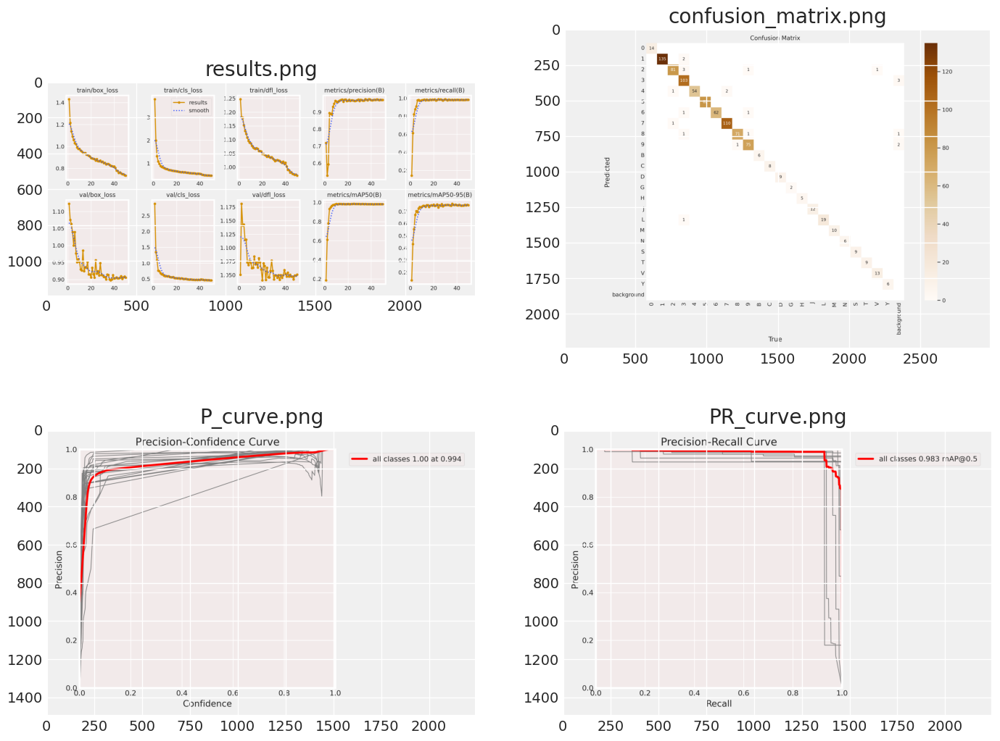

In [36]:
# List of some metrics
metrics = ['results.png','confusion_matrix.png', 'P_curve.png', 'PR_curve.png']

# Plot metrics images
plt.figure(figsize=(15, 12))
i = 1
for image_name in metrics:
    image_path = os.path.join(result_path, image_name)
    image = cv2.imread(image_path)
    
    plt.subplot(2, 2, i)
    
    plt.imshow(image)
    plt.title(image_name)
    i += 1

plt.show()

In [37]:
# Read csv of result
df = pd.read_csv(os.path.join(result_path, 'results.csv'))
df.tail(5)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
45,46,998.502,0.75602,0.47393,0.97547,0.97246,0.98028,0.98341,0.74866,0.91014,0.46380,1.04716,0.000040,0.000040,0.000040
46,47,1019.320,0.74646,0.46894,0.97432,0.97088,0.98115,0.98315,0.75455,0.90186,0.46148,1.04185,0.000033,0.000033,0.000033
47,48,1040.110,0.74672,0.46955,0.97194,0.97287,0.98199,0.98272,0.75030,0.90658,0.46140,1.04913,0.000026,0.000026,0.000026
48,49,1060.930,0.73705,0.46074,0.97318,0.97140,0.98310,0.98300,0.75464,0.90866,0.45800,1.04867,0.000018,0.000018,0.000018
49,50,1081.760,0.73333,0.46155,0.96891,0.97192,0.98314,0.98299,0.75194,0.90543,0.45683,1.05076,0.000011,0.000011,0.000011


In [38]:
# Strip columns
df.columns = df.columns.str.strip()
df.columns

Index(['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')

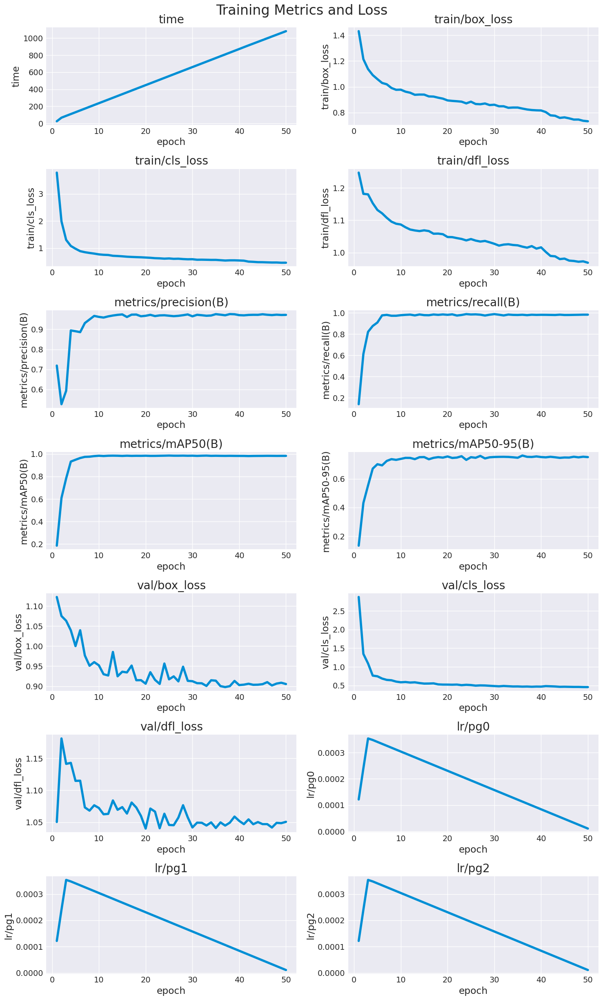

In [39]:
# Define X, y to plot
X = df.epoch
cols = df.columns[1:]

plt.figure(figsize=(15, 25))

for it in range(len(cols)) :
    plt.subplot(7, 2, it+1)
    ax = sns.lineplot(data=df, x=X, y=cols[it])
    ax.set_title(cols[it])
plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.6)
plt.tight_layout()
plt.show()

## <a id='step27'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Test the second model

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Well, Now load best weights to the model and continue the process.

In [40]:
# Load model with best weights
best_model_path = os.path.join(result_path, 'weights/best.pt')
best_model_digits = YOLO(best_model_path)

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 And evaluate the model with best weights.

In [41]:
# Evaluating the model
result_test = best_model_digits.val()

Ultralytics 8.3.21 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 168 layers, 3,010,133 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/valid/labels... 115 images, 0 backgrounds, 0 corrupt: 100%|██████████| 115/115 [00:00<00:00, 408.38it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.16it/s]


                   all        115        918      0.973      0.982      0.983      0.763
                     0         14         14          1      0.874      0.995      0.657
                     1         90        135      0.985      0.993       0.99      0.707
                     2         62         83      0.953      0.967       0.96      0.776
                     3         74        111       0.99      0.932      0.938      0.763
                     4         42         54      0.947      0.995       0.95      0.744
                     5         61         82          1       0.99      0.995      0.782
                     6         51         62      0.966          1      0.979      0.748
                     7         77        112       0.99      0.982      0.994      0.753
                     8         58         72      0.972      0.971      0.983      0.748
                     9         54         78      0.987      0.957      0.968      0.749
                     

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Call some metrics from train and evalueate process.

In [42]:
# list of metrics
keys = ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']

for key in keys :
    print(colored(f'{key} : {result_test.results_dict[key]}', 'green', attrs=['bold']))

metrics/precision(B) : 0.9729909779734337
metrics/recall(B) : 0.98222200436058
metrics/mAP50(B) : 0.9831758130198132
metrics/mAP50-95(B) : 0.7628558187305091


<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 It seems nice too, like first model.

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 OK! now choose some random images from test folder and predict the bboxes and labels.

In [43]:
# all of test images
images = os.listdir(digits_test_images)

num_samples = 12
random_images = random.choices(images, k=num_samples)

# Create a list of path of random test images.
images = []
for image in random_images :
    image_path = os.path.join(digits_test_images, image)
    images.append(image_path)

images

['/kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/test/images/92_jpg.rf.68e83e527149d8a5bb9e0e5f539aff84.jpg',
 '/kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/test/images/car-153-_jpg.rf.a32d2cadf1728c08c35e21a6be02da5b.jpg',
 '/kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/test/images/22_jpg.rf.f798bd832b2e1d95302720942007f1f4.jpg',
 '/kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/test/images/170_jpg.rf.4d6547291fa1b513676caebde809d076.jpg',
 '/kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/test/images/pic-24-_jpg.rf.dd6c7826a7d6c55f32c434bf46aeec8b.jpg',
 '/kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Digits_YOLOV8_V2/test/images/22_jpg.rf.f798bd832b2e1d95302720942007f1f4.jpg',
 '/kaggle/input/persian-car-plates-digits-detection-yolov8/Persian_Plates_Di

In [44]:
# Predict labels and bboxes on random test images one by one
for image in images :
    result = best_model_digits.predict([image], save=True, conf=0.5, iou=0.7)


0: 224x640 2 1s, 2 3s, 1 5, 1 6, 1 7, 1 V, 41.8ms
Speed: 1.4ms preprocess, 41.8ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 640)
Results saved to runs/detect/predict2

0: 224x640 2 1s, 2 3s, 1 4, 1 6, 1 9, 1 J, 8.0ms
Speed: 1.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 640)
Results saved to runs/detect/predict2

0: 224x640 3 1s, 1 3, 1 7, 1 8, 1 9, 1 G, 6.8ms
Speed: 0.9ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 640)
Results saved to runs/detect/predict2

0: 224x640 2 1s, 1 2, 1 3, 1 4, 1 7, 1 8, 1 N, 6.5ms
Speed: 0.8ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 640)
Results saved to runs/detect/predict2

0: 224x640 3 1s, 1 2, 1 3, 1 5, 1 6, 1 B, 6.6ms
Speed: 0.8ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 640)
Results saved to runs/detect/predict2

0: 224x640 3 1s, 1 3, 1 7, 1 8, 1 9, 1 G, 6.5ms
Speed: 0.8ms preprocess, 6.

In [45]:
# Location of saved predicted images
result_path = result[0].save_dir
print(result_path)

runs/detect/predict2


<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Plot test images with predicted boundingboxes. like before, its a visual test too.

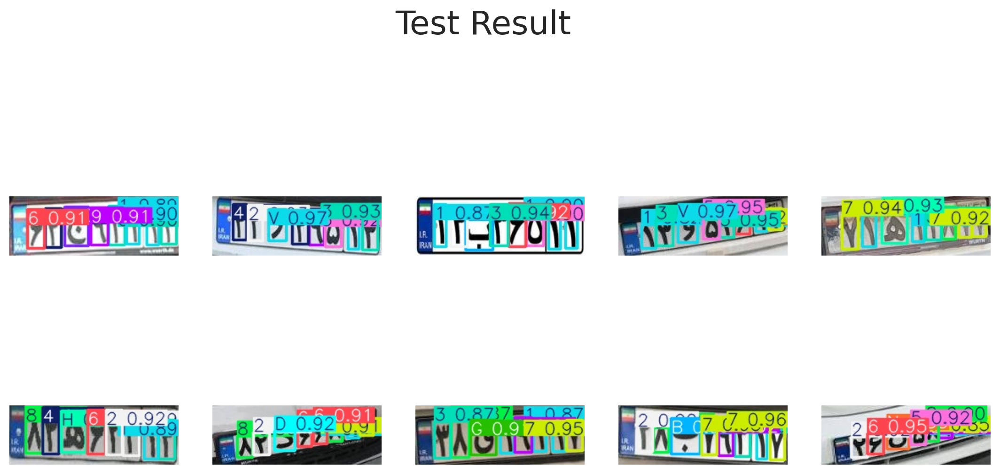

In [46]:
# Show result images
i = 1
plt.figure(figsize=(12, 6), dpi=200)
for image in os.listdir(result_path) :
    image_path = os.path.join(result_path, image)
    plt.suptitle('Test Result', fontsize=25, fontweight=500)
    plt.subplot(2, 5, i)
    plt.imshow(plt.imread(image_path))
    plt.axis('off')
    plt.subplots_adjust(top=0.75)
    i+=1
    if i==11 : break
plt.show()

<div style="background-color:lightgreen; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;"> 👍<b>It seems nice too. Lets go to the another phase to create a pipeline.

<a id="Phase3"></a>
# <p style="padding:10px; margin:0;color:#440381 ;font-size:120% ;text-align:center; border-radius:10px 10px; padding:5px; border:solid 2px #09375b; box-shadow: 8px 8px 8px #042b4c; overflow:hidden;font-weight:900; background-color:#0b0259; color:white">Phase 3 - Make a PipeLine of both models</p>

## <a id='step31'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">PipeLine

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 There are 2 image in extra folder to test the pipeline and a raw plate form to fill. Define pathes.

In [47]:
extra = os.path.join(plate_base, 'extra')
os.listdir(extra)

['test2.jpg', 'test.jpg', 'raw_plate.png']

In [48]:
# Path of files
raw_plate = os.path.join(extra, 'raw_plate.png')
img_path = os.path.join(extra, 'test.jpg')

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 <b>STEP 1</b> Read and load sample image.

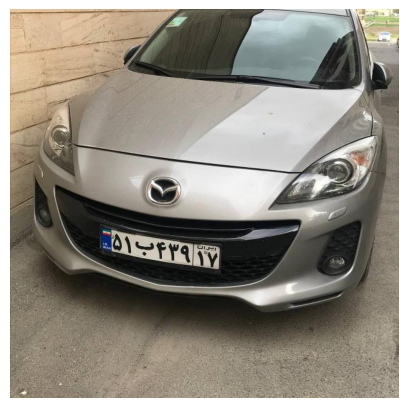

In [49]:
# Read sample image by opencv
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Plot sample image
plt.imshow(img)
plt.axis('off')
plt.show()

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 <b>STEP 2</b> Predict the plate by using first model.

In [50]:
def Clean_Predict_Foder(folder_path) :
    ''' Delete all files in given folder '''
    for image_name in os.listdir(folder_path) :
        img_path = os.path.join(folder_path, image_name)
        os.remove(img_path)
        
    if len(os.listdir(folder_path)) == 0 :
        print(colored(f'{folder_path}  Cleaned.', 'green', attrs=['bold']))
    else :
        print(colored('Mission Failed !!!.', 'red', attrs=['bold']))

# Delete all files in predict folder
Clean_Predict_Foder(os.path.join(working_dir, 'runs/detect/predict'))

/kaggle/working/runs/detect/predict  Cleaned.


In [51]:
def Detect_Plate(img):
    '''
    Predict on a car image and return result folder and predicted image path. 
    '''
    result1 = best_model_plate.predict([img], save=True, iou=0.7)
    # Location of saved predicted images
    result_path1 = result1[0].save_dir

    pred1_path = os.path.join(result_path1, os.listdir(result_path1)[-1])
    return result1, pred1_path

result1, pred1_path = Detect_Plate(img)


0: 640x640 1 Plates, 10.5ms
Speed: 2.0ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


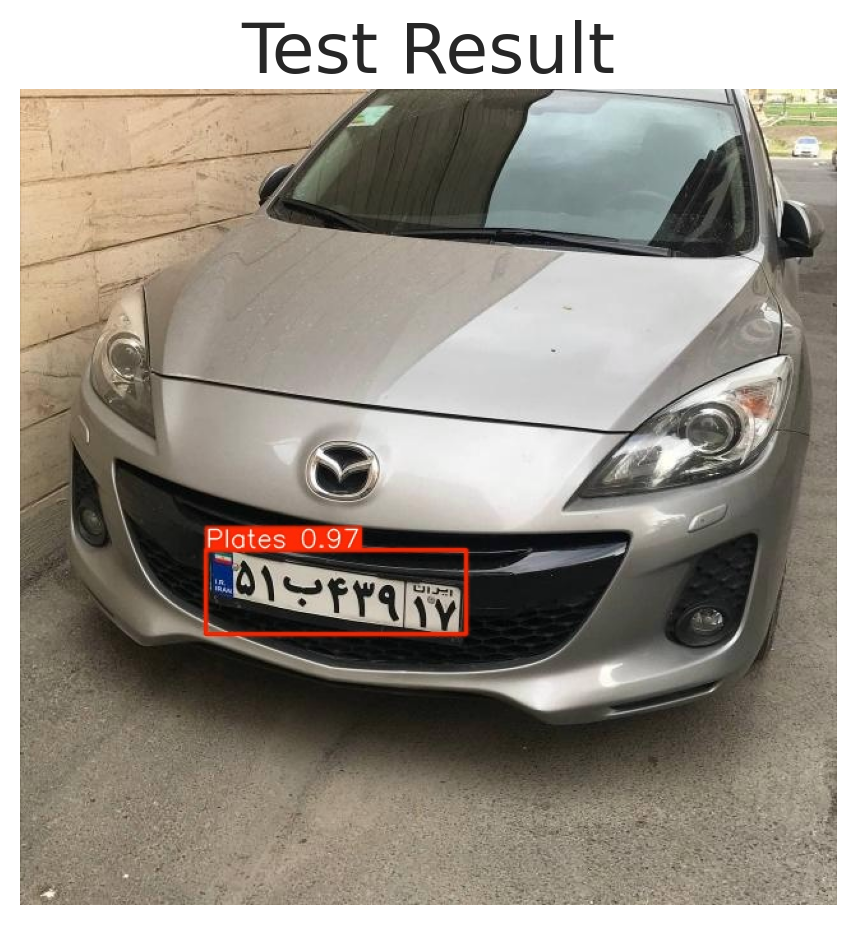

In [52]:
# Show image with plate detected
plt.figure(figsize=(12, 6), dpi=200)

plt.title('Test Result', fontsize=25, fontweight=500)
img = cv2.imread(pred1_path)
plt.imshow(img)
plt.axis('off')
plt.subplots_adjust(top=0.75)


plt.show()

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 <b>STEP 3</b> Find cordinates of plate edges and crop the plate.

In [53]:
# Read cordinates and converted to list
pts = result1[0].boxes.xyxy.tolist()[0]
pts

[145.69256591796875, 361.215576171875, 349.8668518066406, 427.849853515625]

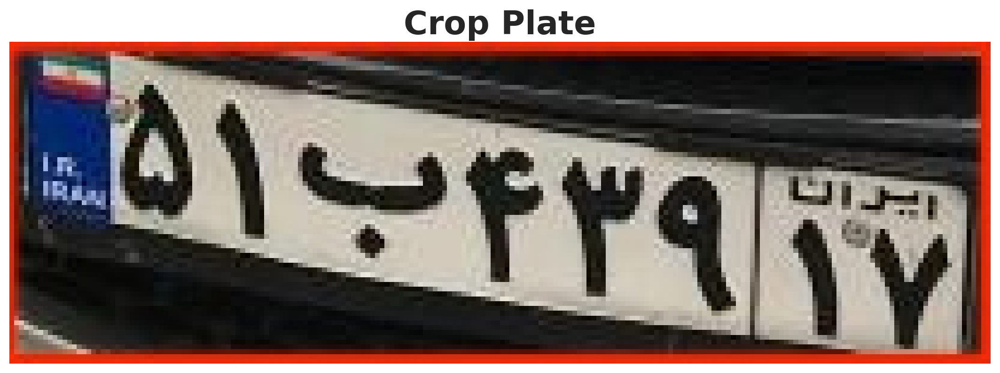

In [54]:
plt.figure(figsize=(12, 6), dpi=200)

plt.title('Crop Plate', fontsize=25, fontweight=900)

# Read image
img = cv2.imread(pred1_path)

# Crop Plate
img2 = img[round(pts[1]):round(pts[3]), round(pts[0]):round(pts[2])]
# Plot plate
plt.imshow(img2)
plt.axis('off')
plt.subplots_adjust(top=0.75)

plt.show()

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 <b>STEP 4</b> Resize the plate, and predict digits by using second model.

In [55]:
img2 = cv2.resize(img2, dsize=(120, 70))

In [56]:
# Delete all files in predict folder
Clean_Predict_Foder(os.path.join(working_dir, 'runs/detect/predict2'))

/kaggle/working/runs/detect/predict2  Cleaned.


In [57]:
def Detect_Digits(img2) :
    '''
    Predict on a croped plate and return result folder and predicted image.
    '''
    result2 = best_model_digits.predict([img2], save=True, iou=0.7, show_conf=False)
    # Location of saved predicted images
    result_path = result2[0].save_dir
    pred2_path = os.path.join(result_path, os.listdir(result_path)[0])
    return result2, pred2_path

result2, pred2_path = Detect_Digits(img2)


0: 384x640 2 1s, 1 3, 1 4, 1 5, 1 7, 1 9, 1 B, 42.9ms
Speed: 2.2ms preprocess, 42.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict2


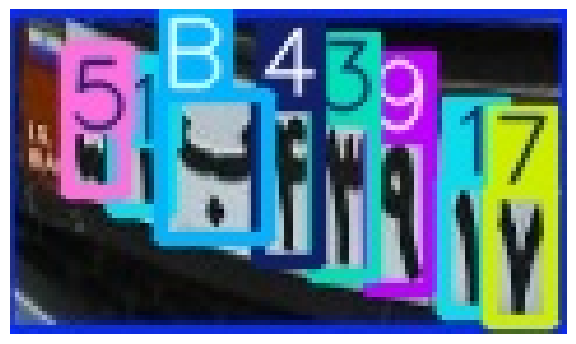

In [58]:
# Plot predicted digits in plate image
plt.imshow(plt.imread(pred2_path))
plt.axis('off')
plt.show()

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 <b>STEP 5</b> Read the labels and sort them by X cordinate.

In [59]:
def Sort_Digits(result2) :
    '''
    Sort detected labels base on their X-cordinate,
    --- Sort from lef to right ---
    '''
    list_of_items = []
    for i in range(len(result2[0])) :
        # Class labels decoded
        class_label = classes_dict[str(int(result2[0][i].boxes.cls))]
        # X cordinate to find the situation on X-axis
        cord_x = int(result2[0][i].boxes.xyxy[0][0])
        list_of_items.append((cord_x, class_label))

    list_of_items.sort()
    list_of_items

    digits = []
    for digit in list_of_items :
        digits.append(digit[1])
    if len(digits) == 7 : digits.append('0')
    return digits

digits = Sort_Digits(result2)
digits

['5', '1', 'B', '4', '3', '9', '1', '7']

In [60]:
# Represent the result
final = f' {digits[0]}{digits[1]} {digits[2]} {digits[3]}{digits[4]}{digits[5]} - Iran {digits[6]}{digits[-1]} '
print(colored(final, 'black', 'on_blue', attrs=['bold']))

 51 B 439 - Iran 17 


<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 <b>STEP 6</b> Fill the prdicted digits and char to raw plate and plot it.

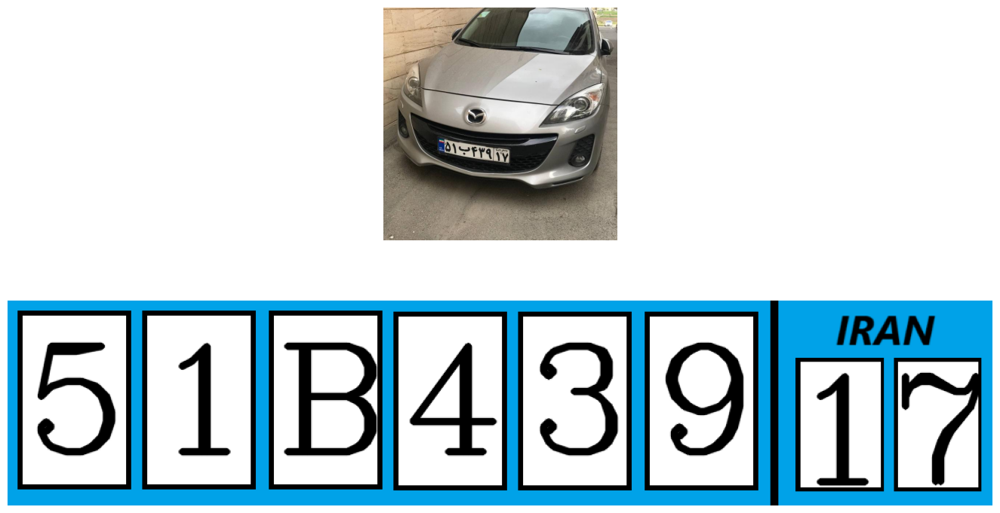

In [61]:
def Plot_Result(img, raw_plate, digits) :
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 1, 1)
    # Read and plotoriginal image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')


    plt.subplot(2, 1, 2)
    # Read raw plate form
    raw_plate = cv2.imread(raw_plate)
    raw_plate = cv2.cvtColor(raw_plate, cv2.COLOR_BGR2RGB)

    # Cordinates of free locations in raw plate
    p1 = (18, 150)
    p2 = (143, 150)
    p3 = (268, 150)
    p4 = (393, 150)
    p5 = (518, 150)
    p6 = (643, 150)
    p7 = (778, 180)
    p8 = (878, 180)

    # Fill the form
    cv2.putText(raw_plate, digits[0], p1, cv2.FONT_HERSHEY_COMPLEX, 5, (0, 0, 0), 5, cv2.LINE_AA)
    cv2.putText(raw_plate, digits[1], p2, cv2.FONT_HERSHEY_COMPLEX, 5, (0, 0, 0), 5, cv2.LINE_AA)
    cv2.putText(raw_plate, digits[2], p3, cv2.FONT_HERSHEY_COMPLEX, 5, (0, 0, 0), 5, cv2.LINE_AA)
    cv2.putText(raw_plate, digits[3], p4, cv2.FONT_HERSHEY_COMPLEX, 5, (0, 0, 0), 5, cv2.LINE_AA)
    cv2.putText(raw_plate, digits[4], p5, cv2.FONT_HERSHEY_COMPLEX, 5, (0, 0, 0), 5, cv2.LINE_AA)
    cv2.putText(raw_plate, digits[5], p6, cv2.FONT_HERSHEY_COMPLEX, 5, (0, 0, 0), 5, cv2.LINE_AA)
    cv2.putText(raw_plate, digits[6], p7, cv2.FONT_HERSHEY_COMPLEX, 5, (0, 0, 0), 5, cv2.LINE_AA)
    cv2.putText(raw_plate, digits[7], p8, cv2.FONT_HERSHEY_COMPLEX, 5, (0, 0, 0), 5, cv2.LINE_AA)

    plt.axis('off')
    plt.subplots_adjust(top=0.75)
    plt.imshow(raw_plate)
    plt.show()

Plot_Result(img, raw_plate, digits)

## <a id='step32'></a>
## <span style="background-color:#035169 ;background-size: cover;font-family:tahoma;font-size:70%; font-weight: 900; text-align:left;border-radius:25px 25px; padding:10px; border:solid 2px #09375b"><span style="color:white">Create Prediction Model

<div style="background-color:#d9f6ff; padding: 10px 10px 10px 10px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:left; color:black">
    <p style="font-size:16px; font-family:tahoma; line-height: 2em; text-indent: 20px;">🔵 Gather all the steps in one function and test the results.

In [62]:
def FINAL(img_path) :
    '''
    A pipeline for all parts of phase 3.
    start with a car image.
    result is digits and char on car plate.
    '''
    # Read car image ( STEP-1 )
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # First prediction -> Detect car-plate ( STEP-2 )
    result1, _ = Detect_Plate(img)

    # Plate Cordinates ( STEP-3 )
    pts = result1[0].boxes.xyxy.tolist()[0]

    # Crop plate
    img2 = img[round(pts[1]):round(pts[3]), round(pts[0]):round(pts[2])]

    # Resize plate to feed to second model ( STEP-4 )
    img2 = cv2.resize(img2, dsize=(120, 70))

    # Second prediction -> Detect digits in plate
    result2, _ = Detect_Digits(img2)

    # Sort detected digits ( STEP-5 )
    digits = Sort_Digits(result2)

    Plot_Result(img, raw_plate, digits)


0: 640x640 1 Plates, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

0: 384x640 2 1s, 1 3, 1 4, 1 5, 1 7, 1 9, 1 B, 7.2ms
Speed: 2.6ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict2


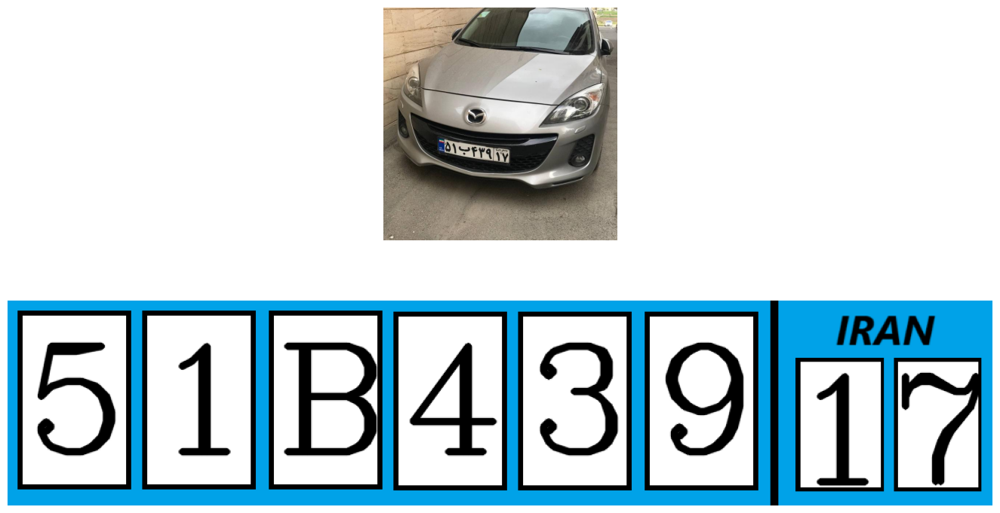

In [63]:
img_path = os.path.join(extra, 'test.jpg')

FINAL(img_path)


0: 640x640 1 Plates, 8.1ms
Speed: 1.8ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

0: 384x640 1 0, 2 2s, 1 7, 1 8, 2 9s, 1 D, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict2


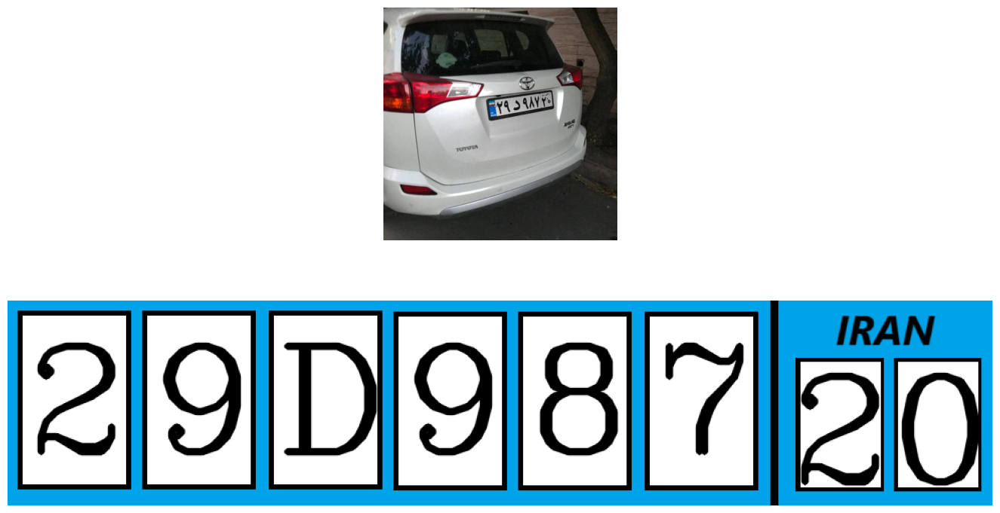

In [64]:
img_path = os.path.join(extra, 'test2.jpg')
FINAL(img_path)

<div style="background-color:#c5d8d1; padding: 25px 0px 10px 0px; border-radius: 10px; box-shadow: 2px 2px 4px 0 rgba(0, 0, 0, 0.1);border:0px solid #0A2342; text-align:center; color:black">
    <p style="font-size:18px; font-family:tahoma; line-height: 2em; text-indent: 20px;"><b>✅ If you like my notebook, please upvote it ✅
    </b></p>
</div>

<div style="text-align:center;">
    <img src="https://i.postimg.cc/t4b3WtCy/1000-F-291522205-Xkrm-S421-Fj-SGTMR.jpg">